In [720]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [721]:
housing_dataset = pd.read_csv('ames.csv')
copy_dataset = housing_dataset.copy()

In [722]:
housing_dataset.head()

,Order,PID,MS.SubClass,MS.Zoning,Lot.Frontage,Lot.Area,Street,Alley,Lot.Shape,Land.Contour,Utilities,Lot.Config,Land.Slope,Neighborhood,Condition.1,Condition.2,Bldg.Type,House.Style,Overall.Qual,Overall.Cond,Year.Built,Year.Remod.Add,Roof.Style,Roof.Matl,Exterior.1st,Exterior.2nd,Mas.Vnr.Type,Mas.Vnr.Area,Exter.Qual,Exter.Cond,Foundation,Bsmt.Qual,Bsmt.Cond,Bsmt.Exposure,BsmtFin.Type.1,BsmtFin.SF.1,BsmtFin.Type.2,BsmtFin.SF.2,Bsmt.Unf.SF,Total.Bsmt.SF,Heating,Heating.QC,Central.Air,Electrical,X1st.Flr.SF,X2nd.Flr.SF,Low.Qual.Fin.SF,Gr.Liv.Area,Bsmt.Full.Bath,Bsmt.Half.Bath,Full.Bath,Half.Bath,Bedroom.AbvGr,Kitchen.AbvGr,Kitchen.Qual,TotRms.AbvGrd,Functional,Fireplaces,Fireplace.Qu,Garage.Type,Garage.Yr.Blt,Garage.Finish,Garage.Cars,Garage.Area,Garage.Qual,Garage.Cond,Paved.Drive,Wood.Deck.SF,Open.Porch.SF,Enclosed.Porch,X3Ssn.Porch,Screen.Porch,Pool.Area,Pool.QC,Fence,Misc.Feature,Misc.Val,Mo.Sold,Yr.Sold,Sale.Type,Sale.Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.0,Unf,0.0,441.0,1080.0,GasA,Fa,Y,SBrkr,1656,0,0,1656,1.0,0.0,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0,Fin,2.0,528.0,TA,TA,P,210,62,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,7,5,1968,1968,Hip,CompShg,BrkFace,BrkFace,None,0.0,Gd,TA,CBlock,TA,TA,No,ALQ,1065.0,Unf,0.0,1045.0,2110.0,GasA,Ex,Y,SBrkr,2110,0,0,2110,1.0,0.0,2,1,3,1,Ex,8,Typ,2,TA,Attchd,1968.0,Fin,2.0,522.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [723]:
copy_dataset.columns = copy_dataset.columns.str.replace('.','')

<ipython-input-723-56aaabf8bf5f>:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  copy_dataset.columns = copy_dataset.columns.str.replace('.','')


In [724]:
copy_dataset.head()

,Order,PID,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,X1stFlrSF,X2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,X3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.0,Unf,0.0,441.0,1080.0,GasA,Fa,Y,SBrkr,1656,0,0,1656,1.0,0.0,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0,Fin,2.0,528.0,TA,TA,P,210,62,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,7,5,1968,1968,Hip,CompShg,BrkFace,BrkFace,None,0.0,Gd,TA,CBlock,TA,TA,No,ALQ,1065.0,Unf,0.0,1045.0,2110.0,GasA,Ex,Y,SBrkr,2110,0,0,2110,1.0,0.0,2,1,3,1,Ex,8,Typ,2,TA,Attchd,1968.0,Fin,2.0,522.0,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [725]:
copy_dataset.Alley.replace({'Grvl':1, 'Pave':2}, inplace=True)

# Lot Shape
copy_dataset.LotShape.replace({'Reg':1, 'IR1':2, 'IR2':3, 'IR3':4}, inplace=True)

# Land Contour
copy_dataset.LandContour.replace({'Low':1, 'HLS':2, 'Bnk':3, 'Lvl':4}, inplace=True)

# Utilities
copy_dataset.Utilities.replace({'ELO':1, 'NoSeWa':2, 'NoSewr':3, 'AllPub':4}, inplace=True)

# Land Slope
copy_dataset.LandSlope.replace({'Sev':1, 'Mod':2, 'Gtl':3}, inplace=True)

# Exterior Quality
copy_dataset.ExterQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Exterior Condition
copy_dataset.ExterCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Basement Quality
copy_dataset.BsmtQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Basement Condition
copy_dataset.BsmtCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Basement Exposure
copy_dataset.BsmtExposure.replace({'No':1, 'Mn':2, 'Av':3, 'Gd':4}, inplace=True)

# Finished Basement 1 Rating
copy_dataset.BsmtFinType1.replace({'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}, inplace=True)

# Finished Basement 2 Rating
copy_dataset.BsmtFinType2.replace({'Unf':1, 'LwQ':2, 'Rec':3, 'BLQ':4, 'ALQ':5, 'GLQ':6}, inplace=True)

# Heating Quality and Condition
copy_dataset.HeatingQC.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Kitchen Quality
copy_dataset.KitchenQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Home functionality
copy_dataset.Functional.replace({'Sal':1, 'Sev':2, 'Maj2':3, 'Maj1':4, 'Mod':5, 'Min2':6, 'Min1':7, 'Typ':8}, inplace=True)

# Fireplace Quality
copy_dataset.FireplaceQu.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Garage Finish
copy_dataset.GarageFinish.replace({'Unf':1, 'RFn':2, 'Fin':3}, inplace=True)

# Garage Quality
copy_dataset.GarageQual.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Garage Condition
copy_dataset.GarageCond.replace({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Paved Driveway
copy_dataset.PavedDrive.replace({'N':1, 'P':2, 'Y':3}, inplace=True)

# Pool Quality
copy_dataset.PoolQC.replace({'Fa':2, 'TA':3, 'Gd':4, 'Ex':5}, inplace=True)

# Fence
copy_dataset.Fence.replace({'GdPrv':4, 'MnPrv':3, 'GdWo':2, 'MnWw':1}, inplace=True)

# We'll set all missing values in our newly converted features to 0
converted_features = ['Alley','LotShape','LandContour','Utilities','LandSlope','ExterQual','ExterCond',
        'BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC',
        'KitchenQual','Functional','FireplaceQu','GarageFinish','GarageQual',
        'GarageCond','PavedDrive','PoolQC','Fence']
copy_dataset[converted_features] = copy_dataset[converted_features].fillna(0)

In [726]:
copy_dataset.isnull().sum()

Order               0
PID                 0
MSSubClass          0
MSZoning            0
LotFrontage       490
LotArea             0
Street              0
Alley               0
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType         23
MasVnrArea         23
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1          1
BsmtFinType2        0
BsmtFinSF2          1
BsmtUnfSF           1
TotalBsmtSF         1
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
X1stFlrSF           0
X2ndFlrSF 

In [727]:
copy_dataset.drop(['Alley','MiscFeature'],inplace = True,axis = 1)

In [728]:
copy_dataset.columns

Index(['Order', 'PID', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea',
       'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'X1stFlrSF', 'X2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDr

In [729]:
copy_dataset.drop(['Order','PID'],inplace = True, axis = 1)

In [730]:
abs_corr_coef=copy_dataset.select_dtypes(include='number').corr()['SalePrice'].abs().sort_values(ascending=False)
abs_corr_coef

SalePrice        1.000000
OverallQual      0.799262
GrLivArea        0.706780
ExterQual        0.697970
KitchenQual      0.672914
GarageCars       0.647877
GarageArea       0.640401
TotalBsmtSF      0.632280
X1stFlrSF        0.621676
BsmtQual         0.607532
YearBuilt        0.558426
GarageFinish     0.549899
FullBath         0.545604
FireplaceQu      0.533901
YearRemodAdd     0.532974
GarageYrBlt      0.526965
MasVnrArea       0.508285
TotRmsAbvGrd     0.495474
Fireplaces       0.474558
HeatingQC        0.450325
BsmtFinSF1       0.432914
BsmtExposure     0.411471
LotFrontage      0.357318
BsmtFinType1     0.336965
WoodDeckSF       0.327143
OpenPorchSF      0.312951
LotShape         0.291420
HalfBath         0.285056
GarageQual       0.277952
BsmtFullBath     0.276050
PavedDrive       0.275964
X2ndFlrSF        0.269373
LotArea          0.266549
GarageCond       0.261805
BsmtCond         0.212074
BsmtUnfSF        0.182855
Fence            0.160071
BedroomAbvGr     0.143913
EnclosedPorc

In [731]:

low_corr=list(abs_corr_coef[abs_corr_coef < 0.4].index)
copy_dataset.drop(low_corr,axis=1,inplace=True)
copy_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 42 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSZoning       2930 non-null   object 
 1   Street         2930 non-null   object 
 2   LotConfig      2930 non-null   object 
 3   Neighborhood   2930 non-null   object 
 4   Condition1     2930 non-null   object 
 5   Condition2     2930 non-null   object 
 6   BldgType       2930 non-null   object 
 7   HouseStyle     2930 non-null   object 
 8   OverallQual    2930 non-null   int64  
 9   YearBuilt      2930 non-null   int64  
 10  YearRemodAdd   2930 non-null   int64  
 11  RoofStyle      2930 non-null   object 
 12  RoofMatl       2930 non-null   object 
 13  Exterior1st    2930 non-null   object 
 14  Exterior2nd    2930 non-null   object 
 15  MasVnrType     2907 non-null   object 
 16  MasVnrArea     2907 non-null   float64
 17  ExterQual      2930 non-null   int64  
 18  Foundati

In [732]:
copy_dataset.isnull().sum()

MSZoning           0
Street             0
LotConfig          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType        23
MasVnrArea        23
ExterQual          0
Foundation         0
BsmtQual           0
BsmtExposure       0
BsmtFinSF1         1
TotalBsmtSF        1
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
X1stFlrSF          0
GrLivArea          0
FullBath           0
KitchenQual        0
TotRmsAbvGrd       0
Fireplaces         0
FireplaceQu        0
GarageType       157
GarageYrBlt      159
GarageFinish       0
GarageCars         1
GarageArea         1
SaleType           0
SaleCondition      0
SalePrice          0
dtype: int64

<AxesSubplot:xlabel='SalePrice', ylabel='Electrical'>

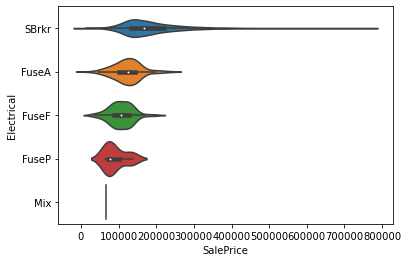

In [733]:
sns.violinplot(y = copy_dataset['Electrical'],x = copy_dataset['SalePrice'])

In [734]:
numColumns = copy_dataset.select_dtypes(include = 'number')
numColumns = list(numColumns.columns)
mode_values = copy_dataset[numColumns].mode().to_dict(orient='records')[0]
copy_dataset = copy_dataset.fillna(mode_values)

In [735]:
copy_dataset.isnull().sum()

MSZoning           0
Street             0
LotConfig          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType        23
MasVnrArea         0
ExterQual          0
Foundation         0
BsmtQual           0
BsmtExposure       0
BsmtFinSF1         0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
X1stFlrSF          0
GrLivArea          0
FullBath           0
KitchenQual        0
TotRmsAbvGrd       0
Fireplaces         0
FireplaceQu        0
GarageType       157
GarageYrBlt        0
GarageFinish       0
GarageCars         0
GarageArea         0
SaleType           0
SaleCondition      0
SalePrice          0
dtype: int64

<AxesSubplot:xlabel='SalePrice', ylabel='GarageType'>

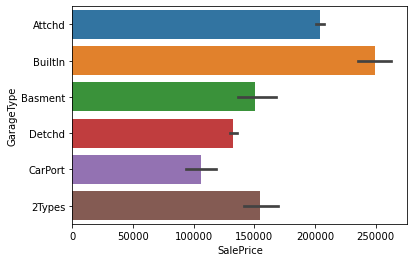

In [736]:
sns.barplot(x = 'SalePrice', y = 'GarageType',data = copy_dataset)

In [737]:
import random
copy_dataset['GarageType'] = copy_dataset['GarageType'].fillna(random.choice(copy_dataset['GarageType'].unique()))

<AxesSubplot:xlabel='SalePrice', ylabel='GarageType'>

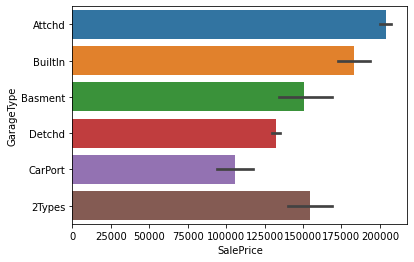

In [738]:
sns.barplot(x = 'SalePrice', y = 'GarageType',data = copy_dataset)

In [739]:
copy_dataset.isnull().sum()

MSZoning          0
Street            0
LotConfig         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType       23
MasVnrArea        0
ExterQual         0
Foundation        0
BsmtQual          0
BsmtExposure      0
BsmtFinSF1        0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
X1stFlrSF         0
GrLivArea         0
FullBath          0
KitchenQual       0
TotRmsAbvGrd      0
Fireplaces        0
FireplaceQu       0
GarageType        0
GarageYrBlt       0
GarageFinish      0
GarageCars        0
GarageArea        0
SaleType          0
SaleCondition     0
SalePrice         0
dtype: int64

In [740]:
copy_dataset['Electrical'].dropna(inplace = True)

In [741]:
copy_dataset.isnull().sum()

MSZoning          0
Street            0
LotConfig         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType       23
MasVnrArea        0
ExterQual         0
Foundation        0
BsmtQual          0
BsmtExposure      0
BsmtFinSF1        0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        1
X1stFlrSF         0
GrLivArea         0
FullBath          0
KitchenQual       0
TotRmsAbvGrd      0
Fireplaces        0
FireplaceQu       0
GarageType        0
GarageYrBlt       0
GarageFinish      0
GarageCars        0
GarageArea        0
SaleType          0
SaleCondition     0
SalePrice         0
dtype: int64

<AxesSubplot:xlabel='SalePrice', ylabel='Electrical'>

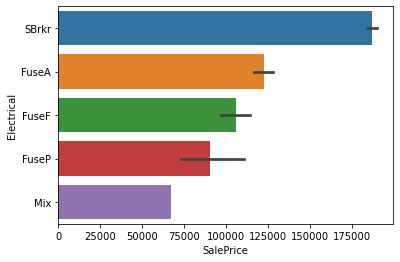

In [742]:
sns.barplot(x = 'SalePrice', y = 'Electrical',data = copy_dataset)

In [743]:
copy_dataset['Electrical'] = copy_dataset['Electrical'].fillna('SBrkr') 

In [744]:
copy_dataset.isnull().sum()

MSZoning          0
Street            0
LotConfig         0
Neighborhood      0
Condition1        0
Condition2        0
BldgType          0
HouseStyle        0
OverallQual       0
YearBuilt         0
YearRemodAdd      0
RoofStyle         0
RoofMatl          0
Exterior1st       0
Exterior2nd       0
MasVnrType       23
MasVnrArea        0
ExterQual         0
Foundation        0
BsmtQual          0
BsmtExposure      0
BsmtFinSF1        0
TotalBsmtSF       0
Heating           0
HeatingQC         0
CentralAir        0
Electrical        0
X1stFlrSF         0
GrLivArea         0
FullBath          0
KitchenQual       0
TotRmsAbvGrd      0
Fireplaces        0
FireplaceQu       0
GarageType        0
GarageYrBlt       0
GarageFinish      0
GarageCars        0
GarageArea        0
SaleType          0
SaleCondition     0
SalePrice         0
dtype: int64

In [745]:
copy_dataset['MasVnrType'] = copy_dataset['MasVnrType'].fillna(random.choice(copy_dataset['MasVnrType'].unique()))

In [746]:
copy_dataset.isnull().sum()

MSZoning         0
Street           0
LotConfig        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
Foundation       0
BsmtQual         0
BsmtExposure     0
BsmtFinSF1       0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
X1stFlrSF        0
GrLivArea        0
FullBath         0
KitchenQual      0
TotRmsAbvGrd     0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageYrBlt      0
GarageFinish     0
GarageCars       0
GarageArea       0
SaleType         0
SaleCondition    0
SalePrice        0
dtype: int64

<AxesSubplot:>

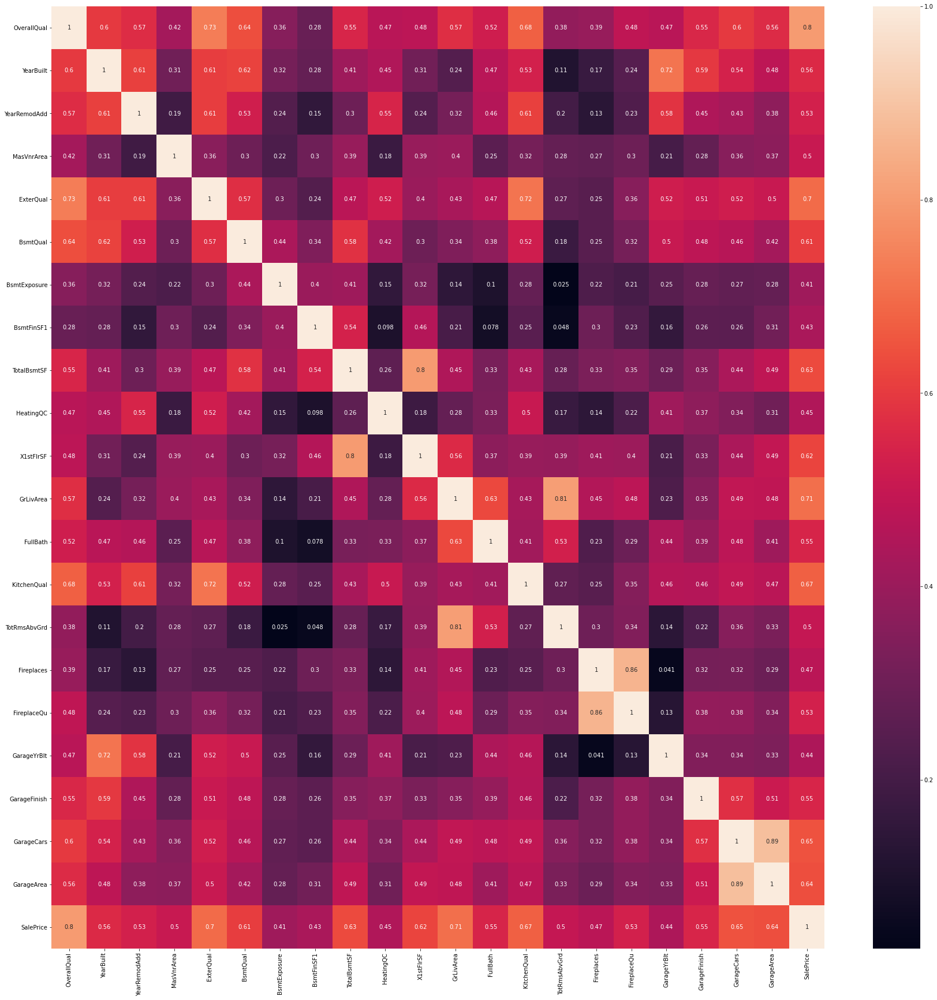

In [747]:

fig,ax = plt.subplots(figsize=(30,30))
sns.heatmap(copy_dataset.corr(),annot=True)

In [748]:
copy_dataset.drop(["TotalBsmtSF","FireplaceQu","TotRmsAbvGrd","GarageArea"],axis=1,inplace=True)


In [749]:
copy_dataset.shape

(2930, 38)

In [750]:
copy_dataset

,MSZoning,Street,LotConfig,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,Heating,HeatingQC,CentralAir,Electrical,X1stFlrSF,GrLivArea,FullBath,KitchenQual,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,SaleType,SaleCondition,SalePrice
0,RL,Pave,Corner,NAmes,Norm,Norm,1Fam,1Story,6,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,3,CBlock,3.0,4.0,639.0,GasA,2,Y,SBrkr,1656,1656,1,3,2,Attchd,1960.0,3.0,2.0,WD,Normal,215000
1,RH,Pave,Inside,NAmes,Feedr,Norm,1Fam,1Story,5,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,CBlock,3.0,1.0,468.0,GasA,3,Y,SBrkr,896,896,1,3,0,Attchd,1961.0,1.0,1.0,WD,Normal,105000
2,RL,Pave,Corner,NAmes,Norm,Norm,1Fam,1Story,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,3,CBlock,3.0,1.0,923.0,GasA,3,Y,SBrkr,1329,1329,1,4,0,Attchd,1958.0,1.0,1.0,WD,Normal,172000
3,RL,Pave,Corner,NAmes,Norm,Norm,1Fam,1Story,7,1968,1968,Hip,CompShg,BrkFace,BrkFace,None,0.0,4,CBlock,3.0,1.0,1065.0,GasA,5,Y,SBrkr,2110,2110,2,5,2,Attchd,1968.0,3.0,2.0,WD,Normal,244000
4,RL,Pave,Inside,Gilbert,Norm,Norm,1Fam,2Story,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,PConc,4.0,1.0,791.0,GasA,4,Y,SBrkr,928,1629,2,3,1,Attchd,1997.0,3.0,2.0,WD,Normal,189900
5,RL,Pave,Inside,Gilbert,Norm,Norm,1Fam,2Story,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,3,PConc,3.0,1.0,602.0,GasA,5,Y,SBrkr,926,1604,2,4,1,Attchd,1998.0,3.0,2.0,WD,Normal,195500
6,RL,Pave,Inside,StoneBr,Norm,Norm,TwnhsE,1Story,8,2001,2001,Gable,CompShg,CemntBd,CmentBd,None,0.0,4,PConc,4.0,2.0,616.0,GasA,5,Y,SBrkr,1338,1338,2,4,0,Attchd,2001.0,3.0,2.0,WD,Normal,213500
7,RL,Pave,Inside,StoneBr,Norm,Norm,TwnhsE,1Story,8,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,4,PConc,4.0,1.0,263.0,GasA,5,Y,SBrkr,1280,1280,2,4,0,Attchd,1992.0,2.0,2.0,WD,Normal,191500
8,RL,Pave,Inside,StoneBr,Norm,Norm,TwnhsE,1Story,8,1995,1996,Gable,CompShg,CemntBd,CmentBd,None,0.0,4,PConc,4.0,1.0,1180.0,GasA,5,Y,SBrkr,1616,1616,2,4,1,Attchd,1995.0,2.0,2.0,WD,Normal,236500
9,RL,Pave,Inside,Gilbert,Norm,Norm,1Fam,2Story,7,1999,1999,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,PConc,3.0,1.0,0.0,GasA,4,Y,SBrkr,1028,1804,2,4,1,Attchd,1999.0,3.0,2.0,WD,Normal,189000


In [751]:
copy_dataset.drop(['SaleCondition','SaleType'],axis=1,inplace=True)

In [752]:
copy_dataset

,MSZoning,Street,LotConfig,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinSF1,Heating,HeatingQC,CentralAir,Electrical,X1stFlrSF,GrLivArea,FullBath,KitchenQual,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,SalePrice
0,RL,Pave,Corner,NAmes,Norm,Norm,1Fam,1Story,6,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,3,CBlock,3.0,4.0,639.0,GasA,2,Y,SBrkr,1656,1656,1,3,2,Attchd,1960.0,3.0,2.0,215000
1,RH,Pave,Inside,NAmes,Feedr,Norm,1Fam,1Story,5,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,CBlock,3.0,1.0,468.0,GasA,3,Y,SBrkr,896,896,1,3,0,Attchd,1961.0,1.0,1.0,105000
2,RL,Pave,Corner,NAmes,Norm,Norm,1Fam,1Story,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,3,CBlock,3.0,1.0,923.0,GasA,3,Y,SBrkr,1329,1329,1,4,0,Attchd,1958.0,1.0,1.0,172000
3,RL,Pave,Corner,NAmes,Norm,Norm,1Fam,1Story,7,1968,1968,Hip,CompShg,BrkFace,BrkFace,None,0.0,4,CBlock,3.0,1.0,1065.0,GasA,5,Y,SBrkr,2110,2110,2,5,2,Attchd,1968.0,3.0,2.0,244000
4,RL,Pave,Inside,Gilbert,Norm,Norm,1Fam,2Story,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,PConc,4.0,1.0,791.0,GasA,4,Y,SBrkr,928,1629,2,3,1,Attchd,1997.0,3.0,2.0,189900
5,RL,Pave,Inside,Gilbert,Norm,Norm,1Fam,2Story,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,3,PConc,3.0,1.0,602.0,GasA,5,Y,SBrkr,926,1604,2,4,1,Attchd,1998.0,3.0,2.0,195500
6,RL,Pave,Inside,StoneBr,Norm,Norm,TwnhsE,1Story,8,2001,2001,Gable,CompShg,CemntBd,CmentBd,None,0.0,4,PConc,4.0,2.0,616.0,GasA,5,Y,SBrkr,1338,1338,2,4,0,Attchd,2001.0,3.0,2.0,213500
7,RL,Pave,Inside,StoneBr,Norm,Norm,TwnhsE,1Story,8,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,4,PConc,4.0,1.0,263.0,GasA,5,Y,SBrkr,1280,1280,2,4,0,Attchd,1992.0,2.0,2.0,191500
8,RL,Pave,Inside,StoneBr,Norm,Norm,TwnhsE,1Story,8,1995,1996,Gable,CompShg,CemntBd,CmentBd,None,0.0,4,PConc,4.0,1.0,1180.0,GasA,5,Y,SBrkr,1616,1616,2,4,1,Attchd,1995.0,2.0,2.0,236500
9,RL,Pave,Inside,Gilbert,Norm,Norm,1Fam,2Story,7,1999,1999,Gable,CompShg,VinylSd,VinylSd,None,0.0,3,PConc,3.0,1.0,0.0,GasA,4,Y,SBrkr,1028,1804,2,4,1,Attchd,1999.0,3.0,2.0,189000


In [753]:
cat = list(copy_dataset.select_dtypes(include = 'object'))
cat

['MSZoning',
 'Street',
 'LotConfig',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'Foundation',
 'Heating',
 'CentralAir',
 'Electrical',
 'GarageType']

In [754]:
copy_dataset.drop(['Street','Condition2','Heating','LotConfig','Condition1','RoofMatl'],inplace = True,axis = 1)


In [755]:
lastCopy = copy_dataset.copy()
cat = list(copy_dataset.select_dtypes(include = 'object'))
#cat
category_df = lastCopy.drop(list(lastCopy.select_dtypes(include='number').columns),axis=1)
lastCopy.drop(copy_dataset.select_dtypes(include='object').columns,axis=1,inplace=True)
#X = copy_dataset.drop('SalePrice',axis=1)
#Y = copy_dataset['SalePrice']
#category_df
lastCopy

,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinSF1,HeatingQC,X1stFlrSF,GrLivArea,FullBath,KitchenQual,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,SalePrice
0,6,1960,1960,112.0,3,3.0,4.0,639.0,2,1656,1656,1,3,2,1960.0,3.0,2.0,215000
1,5,1961,1961,0.0,3,3.0,1.0,468.0,3,896,896,1,3,0,1961.0,1.0,1.0,105000
2,6,1958,1958,108.0,3,3.0,1.0,923.0,3,1329,1329,1,4,0,1958.0,1.0,1.0,172000
3,7,1968,1968,0.0,4,3.0,1.0,1065.0,5,2110,2110,2,5,2,1968.0,3.0,2.0,244000
4,5,1997,1998,0.0,3,4.0,1.0,791.0,4,928,1629,2,3,1,1997.0,3.0,2.0,189900
5,6,1998,1998,20.0,3,3.0,1.0,602.0,5,926,1604,2,4,1,1998.0,3.0,2.0,195500
6,8,2001,2001,0.0,4,4.0,2.0,616.0,5,1338,1338,2,4,0,2001.0,3.0,2.0,213500
7,8,1992,1992,0.0,4,4.0,1.0,263.0,5,1280,1280,2,4,0,1992.0,2.0,2.0,191500
8,8,1995,1996,0.0,4,4.0,1.0,1180.0,5,1616,1616,2,4,1,1995.0,2.0,2.0,236500
9,7,1999,1999,0.0,3,3.0,1.0,0.0,4,1028,1804,2,4,1,1999.0,3.0,2.0,189000


In [756]:
#X = lastCopy.drop('SalePrice',axis = 1)
#y = lastCopy['SalePrice']
#lastCopy = pd.concat([lastCopy,pd.get_dummies(category_df[cat[0]],drop_first=True)],axis = 1)
lastCopy

,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinSF1,HeatingQC,X1stFlrSF,GrLivArea,FullBath,KitchenQual,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,SalePrice
0,6,1960,1960,112.0,3,3.0,4.0,639.0,2,1656,1656,1,3,2,1960.0,3.0,2.0,215000
1,5,1961,1961,0.0,3,3.0,1.0,468.0,3,896,896,1,3,0,1961.0,1.0,1.0,105000
2,6,1958,1958,108.0,3,3.0,1.0,923.0,3,1329,1329,1,4,0,1958.0,1.0,1.0,172000
3,7,1968,1968,0.0,4,3.0,1.0,1065.0,5,2110,2110,2,5,2,1968.0,3.0,2.0,244000
4,5,1997,1998,0.0,3,4.0,1.0,791.0,4,928,1629,2,3,1,1997.0,3.0,2.0,189900
5,6,1998,1998,20.0,3,3.0,1.0,602.0,5,926,1604,2,4,1,1998.0,3.0,2.0,195500
6,8,2001,2001,0.0,4,4.0,2.0,616.0,5,1338,1338,2,4,0,2001.0,3.0,2.0,213500
7,8,1992,1992,0.0,4,4.0,1.0,263.0,5,1280,1280,2,4,0,1992.0,2.0,2.0,191500
8,8,1995,1996,0.0,4,4.0,1.0,1180.0,5,1616,1616,2,4,1,1995.0,2.0,2.0,236500
9,7,1999,1999,0.0,3,3.0,1.0,0.0,4,1028,1804,2,4,1,1999.0,3.0,2.0,189000


In [757]:
#x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.3)
#cat
#features_to_try=[]
#category_df[cat[0]]
#pd.get_dummies(category_df[cat[0]])
#lastCopy
for category in cat:
 #   category_df[cat] = category_df[cat].astype('category')
  #  category_df[cat]
    lastCopy = pd.concat([lastCopy,pd.get_dummies(category_df[category],drop_first=True)],axis = 1)
    X = lastCopy.drop('SalePrice',axis = 1)
    Y = lastCopy['SalePrice']
    x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.3,random_state = 50)
    #lastCopy.drop(category,inplace = True , axis = 1)
    #x_test = pd.concat([x_test,pd.get_dummies(category_df[category],drop_first=True)])
    #x_test.drop(category,inplace = True , axis = 1)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    predictions = lr.predict(x_test)
    mse = mean_squared_error(predictions,y_test)
    rmse=np.sqrt(mse)
    print('after adding feature {} the error is {}\n\n'.format(category,rmse))
    
#lastCopy    

after adding feature MSZoning the error is 28205.29231445726


after adding feature Neighborhood the error is 27773.906249082895


after adding feature BldgType the error is 26381.801102906145


after adding feature HouseStyle the error is 26711.461422448738


after adding feature RoofStyle the error is 26708.925273679684


after adding feature Exterior1st the error is 26549.053746737314


after adding feature Exterior2nd the error is 27037.150146816308


after adding feature MasVnrType the error is 27109.431219983486


after adding feature Foundation the error is 27152.05977272246


after adding feature CentralAir the error is 27154.419824542274


after adding feature Electrical the error is 27280.560813029766


after adding feature GarageType the error is 27350.624361025406




In [758]:

#X = lastCopy.drop('SalePrice',axis=1)
#Y = lastCopy['SalePrice']
#x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.3)


In [759]:
#lr = LinearRegression()
#lr.fit(x_train,y_train)
#lr.fit(x_train,y_train)
#predictions = lr.predict(x_test)

In [760]:
#lr.fit(x_train,y_train)
#predictions = lr.predict(x_test)

In [761]:
    #mse = mean_squared_error(predictions,y_test)
    #rmse=np.sqrt(mse)
    #print('the error is {}'.format(rmse))

In [762]:
copy_dataset.drop(['HouseStyle','Exterior2nd','CentralAir'],inplace = True,axis = 1)

In [763]:
cat.remove('HouseStyle')
cat.remove('Exterior2nd')
cat.remove('CentralAir')

In [764]:
for category in cat:
    copy_dataset = pd.concat([copy_dataset,pd.get_dummies(category_df[category],drop_first=True)],axis = 1)
    copy_dataset.drop(category,inplace = True , axis = 1)
    

In [765]:
X = copy_dataset.drop('SalePrice',axis = 1)
Y = copy_dataset['SalePrice']
x_train,x_test,y_train,y_test = train_test_split(X,Y,test_size = 0.3,random_state = 50)
lr = LinearRegression()
lr.fit(x_train,y_train)
predictions = lr.predict(x_test)
mse = mean_squared_error(predictions,y_test)
rmse=np.sqrt(mse)
print('the error is {}'.format(rmse))

the error is 26481.0411369029
